In [1]:
%matplotlib inline
%config InlineBackend.figure_format='svg'
#%config InlineBackend.figure_format='retina'

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from astropy.stats import LombScargle

from scipy import integrate
import astropy
from astropy.time import Time

import pyfits
%matplotlib inline
plt.style.use('seaborn-whitegrid')


import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from astropy.stats import LombScargle
import matplotlib.ticker as ticker



In [2]:
                                                        
def convert_xaxis_mjd(time):
    return Time(time).mjd   

def convert_xaxis_time(mjd):
    return Time(mjd,format='mjd').to_datetime()



def date2yday(x):
    """
    x is in matplotlib datenums, so they are floats.
    """
    y = x - mdates.date2num(datetime.datetime(2018, 1, 1))+58119
    return y


def yday2date(x):
    """
    return a matplotlib datenum (x is days since start of year)
    """
    y = x + mdates.date2num(datetime.datetime(2018, 1, 1))
    return y


def mjd2date(x):
    y = x + mdates.date2num(datetime.datetime(2007, 1, 1))
    return y

def date2mjd(x):    
    y = x - mdates.date2num(datetime.datetime(2007, 1, 1))+54101
    return y 



def convert_partial_year(numbers):
    datetimes=[]
    for number in numbers:
        year = int(number)
        d = timedelta(days=(number - year)*(365 + is_leap(year)))
        day_one = datetime(year,1,1)
        date = d + day_one
        datetimes.append(date)
    return datetimes


def is_leap(year):
    if not year%4 and  year%100 or not year%400:
        return True
    return False


def convert_mjd(times):
    timesmjd=[]
    for i in times:
        timesmjd.append(Time(i).mjd)
    return timesmjd  


def convert_date(times):
    timesdate=[]
    for i in times:
        timesdate.append(Time(i,format='mjd').datetime)
    return timesdate

def convert_date_single(time):
    timedate=Time(time,format='mjd').datetime
    return timedate

# [AB magnitude System](https://www.cfa.harvard.edu/~dfabricant/huchra/ay145/mags.html)

This magnitude system is defined such that, when monochromatic flux f is measured in erg sec^-1 cm^-2 Hz^-1,
m(AB) = -2.5 log(f) - 48.60
where the value of the constant is selected to define m(AB)=V for a flat-spectrum source. In this system, an object with constant flux per unit frequency interval has zero color.
References:

Oke, J.B. 1974, ApJS, 27, 21

In [ ]:
3C 273                         12h29m06.7s +02d03m09s QSO    >30000  0.158339




# data_all

## SMA

In [3]:
data_3c273_sma=pd.read_excel('/Users/brettlv/Downloads/3C273/3c273_sma.xlsx',sheet_name='Sheet2')#SMA
data_3c273_sma.columns=['BAND', 'UT_DATE_TIME', 'ins', 'F(GHz)', 'FLUX(JY)', '+/-', 'ERROR','FLUX_P.I.']
data_3c273_sma['mjd']=convert_mjd(data_3c273_sma['UT_DATE_TIME'])
data_3c273_1mm=data_3c273_sma[data_3c273_sma['BAND']=='1mm']
data_3c273_850=data_3c273_sma[data_3c273_sma['BAND']==850]
dcf_sma_1mm=pd.DataFrame({'t':data_3c273_1mm['mjd'],'flux':data_3c273_1mm['FLUX(JY)'],'err':data_3c273_1mm['ERROR']},index=None,columns=['t','flux','err'])
dcf_sma_850=pd.DataFrame({'t':data_3c273_850['mjd'],'flux':data_3c273_850['FLUX(JY)'],'err':data_3c273_850['ERROR']},index=None,columns=['t','flux','err'])
dcf_sma_1mm.to_csv('/Users/brettlv/Downloads/3C273/dcf_sma_1mm.csv',index=False,header=False)
dcf_sma_850.to_csv('/Users/brettlv/Downloads/3C273/dcf_sma_850.csv',index=False,header=False)

In [141]:
dcf_sma_1mm

,t,flux,err
0,52657.272917,8.610,0.447
1,52682.373611,7.270,0.391
2,52691.456250,7.500,0.446
3,52725.022917,5.390,0.335
4,52725.212500,6.370,0.360
5,52730.005556,7.580,0.512
6,52736.227083,6.410,0.342
7,52743.201389,5.260,0.421
8,52747.195139,5.770,0.306
9,52748.274306,5.960,0.300


In [101]:
(np.max(dcf_sma_1mm['t'])-np.min(dcf_sma_1mm['t'][0]))/(dcf_sma_1mm['t'].size-1)

9.326638370485568

ls /Users/brettlv/Downloads/3C273/*.csv

In [ ]:
m(AB) = -2.5 log(f) - 48.60
2.5 log(f) = - 48.60 -m(AB)

## V and R

In [157]:
data_V_all=pd.DataFrame()
for q in range(10):
    i=q+1
    data_V=pd.read_csv('/Users/brettlv/Downloads/3C273/Vband_%d.csv'%i,header=1)
    data_V_select=data_V[data_V['Object']=='3C 273']
    data_V_mjd_flux_err= data_V_select[{'JD','V','σ(V)'}]
    data_V_mjd_flux_err['JD']=pd.to_numeric(data_V_mjd_flux_err['JD'], errors='coerce')
    data_V_mjd_flux_err['V']=pd.to_numeric(data_V_mjd_flux_err['V'], errors='coerce')
    data_V_mjd_flux_err['σ(V)']=pd.to_numeric(data_V_mjd_flux_err['σ(V)'], errors='coerce')
    data_V_mjd_flux_err['mjd']=data_V_mjd_flux_err['JD']-2400000.5
    data_V_all=pd.concat([data_V_all,data_V_mjd_flux_err],ignore_index=True)
    
data_V_all['log_flux']=(-48.6-data_V_all['V'])/2.5
data_V_all['log_err']=data_V_all['σ(V)']/2.5

mag_V_all=pd.DataFrame({'t':data_V_all['mjd'],'flux':data_V_all['V'],'err':data_V_all['σ(V)']},index=None,columns=['t','flux','err'])
mag_V_all.to_csv('/Users/brettlv/Downloads/3C273/mag_V_all.csv',index=False,header=False)

dcf_V_all=pd.DataFrame({'t':data_V_all['mjd'],'flux':data_V_all['log_flux'],'err':data_V_all['log_err']},index=None,columns=['t','flux','err'])
dcf_V_all.to_csv('/Users/brettlv/Downloads/3C273/dcf_V_all.csv',index=False,header=False)

/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/

In [158]:
data_R_all=pd.DataFrame()
for q in range(10):
    i=q+1
    data_R=pd.read_csv('/Users/brettlv/Downloads/3C273/Rband_%d.csv'%i,header=1)
    data_R_select=data_R[data_R['Object']=='3C 273']
    data_R_mjd_flux_err= data_R_select[{'JD','R','σ(R)'}]
    data_R_mjd_flux_err['JD']=pd.to_numeric(data_R_mjd_flux_err['JD'], errors='coerce')
    data_R_mjd_flux_err['R']=pd.to_numeric(data_R_mjd_flux_err['R'], errors='coerce')
    data_R_mjd_flux_err['σ(R)']=pd.to_numeric(data_R_mjd_flux_err['σ(R)'], errors='coerce')
    data_R_mjd_flux_err['mjd']=data_R_mjd_flux_err['JD']-2400000.5
    data_R_all=pd.concat([data_R_all,data_R_mjd_flux_err],ignore_index=True)
    
data_R_all['log_flux']=(-48.6-data_R_all['R'])/2.5
data_R_all['log_err']=data_R_all['σ(R)']/2.5    
  
mag_R_all=pd.DataFrame({'t':data_R_all['mjd'],'flux':data_R_all['R'],'err':data_R_all['σ(R)']},index=None,columns=['t','flux','err'])
mag_R_all.to_csv('/Users/brettlv/Downloads/3C273/mag_R_all.csv',index=False,header=False)        
    
dcf_R_all=pd.DataFrame({'t':data_R_all['mjd'],'flux':data_R_all['log_flux'],'err':data_R_all['log_err']},index=None,columns=['t','flux','err'])
dcf_R_all.to_csv('/Users/brettlv/Downloads/3C273/dcf_R_all.csv',index=False,header=False)    

/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:7: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:8: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:9: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/

## smarts

In [9]:
data_smarts

,JD_start,B_JD_start,Bmag,Berr,V_JD_start,Vmag,Verr,R_JD_start,Rmag,Rerr,J_JD_start,Jmag,Jerr,K_JD_start,Kmag,Kerr
0,2.454502e+06,9.990000e+02,999.000,999.000,9.990000e+02,999.000,999.000,9.990000e+02,999.000,999.000,2.454502e+06,11.458,0.005,9.990000e+02,999.000,999.000
1,2.454538e+06,9.990000e+02,999.000,999.000,9.990000e+02,999.000,999.000,2.454538e+06,12.447,0.001,2.454538e+06,11.416,0.005,9.990000e+02,999.000,999.000
2,2.454604e+06,9.990000e+02,999.000,999.000,9.990000e+02,999.000,999.000,2.454604e+06,12.519,0.001,2.454604e+06,11.478,0.005,2.454604e+06,9.682,0.002
3,2.454663e+06,9.990000e+02,999.000,999.000,9.990000e+02,999.000,999.000,9.990000e+02,999.000,999.000,2.454663e+06,11.526,0.005,2.454663e+06,9.711,0.003
4,2.454677e+06,2.454677e+06,12.950,0.002,2.454677e+06,12.705,0.002,2.454677e+06,12.577,0.002,2.454677e+06,11.443,0.003,9.990000e+02,999.000,999.000
5,2.454811e+06,9.990000e+02,999.000,999.000,9.990000e+02,999.000,999.000,9.990000e+02,999.000,999.000,2.454811e+06,11.400,0.003,9.990000e+02,999.000,999.000
6,2.454813e+06,2.454813e+06,12.967,0.002,2.454813e+06,12.691,0.002,2.454813e+06,12.554,0.002,2.454813e+06,11.388,0.003,9.990000e+02,999.000,999.000
7,2.454822e+06,2.454822e+06,12.949,0.002,2.454822e+06,12.708,0.002,2.454822e+06,12.563,0.002,2.454822e+06,11.426,0.003,9.990000e+02,999.000,999.000
8,2.454824e+06,2.454824e+06,12.958,0.002,2.454824e+06,12.708,0.002,2.454824e+06,12.563,0.002,2.454824e+06,11.400,0.003,9.990000e+02,999.000,999.000
9,2.454826e+06,2.454826e+06,12.955,0.002,2.454826e+06,12.708,0.002,2.454826e+06,12.565,0.002,2.454826e+06,11.387,0.003,9.990000e+02,999.000,999.000


B_JD_start Bmag Berr
V_JD_start Vmag Verr
R_JD_start Rmag Rerr
J_JD_start Jmag Jerr
K_JD_start Kmag Kerr


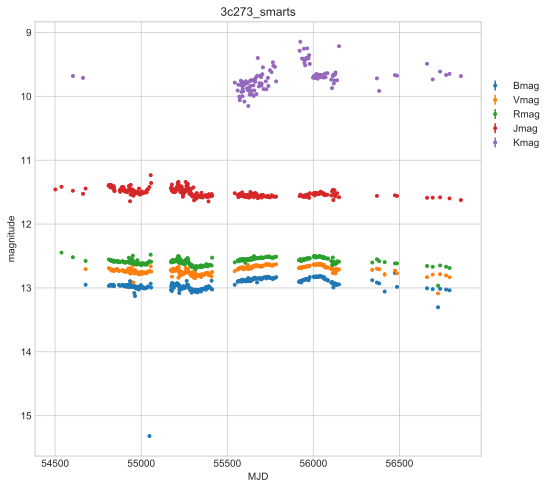

In [162]:
data_smarts=pd.read_csv('/Users/brettlv/Downloads/3C273/3C273_smarts.csv')

fig, axs = plt.subplots(1, 1,figsize=(8,8))
axs.set_title('3c273_smarts')

for i in range(5):
    name_jd=data_smarts.columns[i*3+1]
    name_band=data_smarts.columns[i*3+2]
    name_err=data_smarts.columns[i*3+3]
    print(name_jd,name_band,name_err)
    data_smarts_band=data_smarts[data_smarts[name_jd]!=999.000]   
    
    dcf_smarts_data=pd.DataFrame({'t':data_smarts_band[name_jd]-2400000.5,'flux':(-48.6-data_smarts_band[name_band])/2.5,'err':data_smarts_band[name_err]/2.5},index=None,columns=['t','flux','err'])            
    dcf_smarts_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_smarts_%s_data.csv'%name_band,index=False,header=False)

    
    mag_smarts_data=pd.DataFrame({'t':data_smarts_band[name_jd]-2400000.5,'flux':data_smarts_band[name_band],'err':data_smarts_band[name_err]},index=None,columns=['t','flux','err'])            
    mag_smarts_data.to_csv('/Users/brettlv/Downloads/3C273/mag_smarts_%s_data.csv'%name_band,index=False,header=False)
    axs.errorbar(data_smarts_band[name_jd]-2400000.5,data_smarts_band[name_band],data_smarts_band[name_err],fmt='.',label=name_band)

axs.set_ylabel('magnitude')    
axs.invert_yaxis()
axs.legend(loc=[1.0,0.7])
plt.xlabel('MJD')
plt.savefig('/Users/brettlv/Downloads/smarts_lc.png',dpi=400)
#plt.semilogy()


## Fermi

In [12]:
gamma_week_path='/Users/brettlv/Downloads/3C273/3C273_604800.lc'
lightcurve_week=pyfits.open(gamma_week_path)
#header=lightcurve_week[0].header
time_week=lightcurve_week[1].data['START']
count_week=lightcurve_week[1].data['FLUX_100_300000']
counterr_week=lightcurve_week[1].data['ERROR_100_300000']
during_week=lightcurve_week[1].data['DURATION']

t_week=time_week/86400+lightcurve_week[1].header['MJDREFI']+7.428703703703703e-4
data_gamma_week=pd.DataFrame({'t':t_week,'flux':count_week,'err':counterr_week},index=None,columns=['t','flux','err'])
dcf_data_gamma_week=pd.DataFrame({'t':t_week,'flux':count_week,'err':counterr_week},index=None,columns=['t','flux','err'])
dcf_data_gamma_week.to_csv('/Users/brettlv/Downloads/3C273/dcf_gamma3c273week.csv',index=False,header=False)

dcf_data_gamma_week_e7=pd.DataFrame({'t':t_week,'flux':count_week*1e7,'err':counterr_week*1e7},index=None,columns=['t','flux','err'])
dcf_data_gamma_week_e7.to_csv('/Users/brettlv/Downloads/3C273/dcf_e7_gamma3c273week.csv',index=False,header=False)


## kim

In [13]:
from astropy.io import ascii
data_kim_alma = pd.read_table("/Users/brettlv/Downloads/3C273/3C273kim_J_A+A_636_A62/alma.dat",header=None,delimiter='|')  
data_kim_butot = pd.read_table("/Users/brettlv/Downloads/3C273/3C273kim_J_A+A_636_A62/butot.dat",header=None,delimiter='|')  

/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:2: FutureWarning: read_table is deprecated, use read_csv instead.
  from ipykernel import kernelapp as app
/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:3: FutureWarning: read_table is deprecated, use read_csv instead.
  app.launch_new_instance()


In [14]:
mjd_kim_alma=data_kim_alma[0]
flux_and_err_kim_alma=data_kim_alma[1]
flux_kim_alma=[]
err_kim_alma=[]

for i in flux_and_err_kim_alma:
    flux_kim_alma.append(float(i.split()[0]))
    err_kim_alma.append(float(i.split()[1]))

flux_kim_alma=np.array(flux_kim_alma)
err_kim_alma=np.array(err_kim_alma)

print(max(flux_kim_alma),min(flux_kim_alma))

dcf_alma_data=pd.DataFrame({'t':mjd_kim_alma,'flux':flux_kim_alma,'err':err_kim_alma},index=None,columns=['t','flux','err'])
dcf_alma_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_alma_data.csv',index=False,header=False)



mjd_kim_butot=data_kim_butot[0]
flux_and_err_kim_butot=data_kim_butot[1]
flux_kim_butot=[]
err_kim_butot=[]

for i in flux_and_err_kim_butot:
    flux_kim_butot.append(float(i.split()[0]))
    err_kim_butot.append(float(i.split()[1]))

flux_kim_butot=np.array(flux_kim_butot)
err_kim_butot=np.array(err_kim_butot)
print(max(flux_kim_butot),min(flux_kim_butot))

dcf_butot_data=pd.DataFrame({'t':mjd_kim_butot,'flux':flux_kim_butot,'err':err_kim_butot},index=None,columns=['t','flux','err'])
dcf_butot_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_butot_data.csv',index=False,header=False)



19.83 7.34
18.2601 4.7912


## ovro_40m

In [15]:
ovro_40m_data=pd.read_csv('/Users/brettlv/Downloads/3C273/J1229+0203_OVRO_40m.csv')
dcf_ovro_40m_data=pd.DataFrame({'t':ovro_40m_data['mjd'],'flux':ovro_40m_data['flux'],'err':ovro_40m_data['flux err']},index=None,columns=['t','flux','err'])
dcf_ovro_40m_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_ovro_40m_data.csv',index=False,header=False)


## mojave_15GHz

In [19]:
mojave_15GHz_data=pd.read_excel('/Users/brettlv/Downloads/3C273/VLBA_3c273.xlsx')
mojave_15GHz_data=mojave_15GHz_data[mojave_15GHz_data['VLBA I'].notnull()]
mojave_15GHz_data=mojave_15GHz_data[mojave_15GHz_data['VLBA Code'].notnull()]

mojave_15GHz_data.columns=['Epoch', 'VLBA Code', 'VLBA I', 'VLBA P', 'VLBA percentage', 'VLBA degree',
       'I Image (Nat. Weight)', 'Tapered I Image',
       'Tapered I Image (Widefield)', 'Visibility', 'Stokes I Radplot', 'Pol.']


mojave_15GHz_data['mjd']=convert_mjd(mojave_15GHz_data['Epoch'])
mojave_15GHz_data['flux']=mojave_15GHz_data['VLBA I']/1000
mojave_15GHz_data['err']=0
dcf_mojave_15GHz_data=pd.DataFrame({'t':mojave_15GHz_data['mjd'],'flux':mojave_15GHz_data['flux'],'err':mojave_15GHz_data['err']},index=None,columns=['t','flux','err'])
dcf_mojave_15GHz_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_mojave_15GHz_data.csv',index=False,header=False)


In [20]:
mojave_15GHz_data.columns

Index(['Epoch', 'VLBA Code', 'VLBA I', 'VLBA P', 'VLBA percentage',
       'VLBA degree', 'I Image (Nat. Weight)', 'Tapered I Image',
       'Tapered I Image (Widefield)', 'Visibility', 'Stokes I Radplot', 'Pol.',
       'mjd', 'flux', 'err'],
      dtype='object')

VLBA I
VLBA P
VLBA percentage
VLBA degree


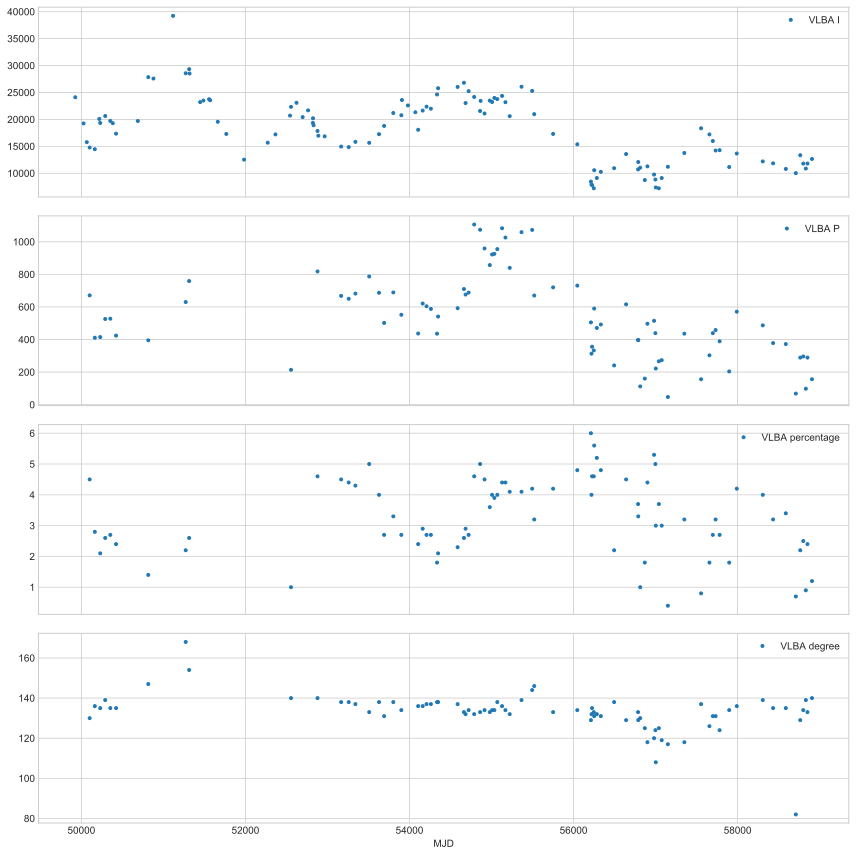

In [25]:
fig, axs = plt.subplots(4, 1,sharex=True,figsize=(12,12))
for i in range(4):
    name_band=mojave_15GHz_data.columns[i+2]
    print(name_band)
    mojave_15GHz_data_plot=mojave_15GHz_data[mojave_15GHz_data[name_band].notnull()]
    dcf_mojave_15GHz_data=pd.DataFrame({'t':mojave_15GHz_data_plot['mjd'],'flux':mojave_15GHz_data_plot[name_band],'err':0},index=None,columns=['t','flux','err'])        
    dcf_mojave_15GHz_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_VLBA_%s_data.csv'%name_band,index=False,header=False)
    axs[i].errorbar(mojave_15GHz_data_plot['mjd'],mojave_15GHz_data_plot[name_band],fmt='.',label=name_band)    
    axs[i].legend()   
'''axs[0].set_title('VLBA I(mJy)')
axs[1].set_title('VLBA P(mJy)')
axs[2].set_title('Palarization percentage')
axs[2].set_title('Palarization degree')'''
plt.xlabel('MJD')
plt.tight_layout()
plt.subplots_adjust(hspace = 0.1)
plt.savefig('/Users/brettlv/Downloads/mojave15Ghz_lc.png',dpi=400)

## WISE

mjd w1mpro_ep w1sigmpro_ep
mjd w2mpro_ep w2sigmpro_ep
mjd w3mpro_ep w3sigmpro_ep
mjd w4mpro_ep w4sigmpro_ep
mjd w1mpro w1sigmpro
mjd w2mpro w2sigmpro
mjd w1mpro_allwise w1sigmpro_allwise
mjd w2mpro_allwise w2sigmpro_allwise
mjd w3mpro_allwise w3sigmpro_allwise
mjd w4mpro_allwise w4sigmpro_allwise


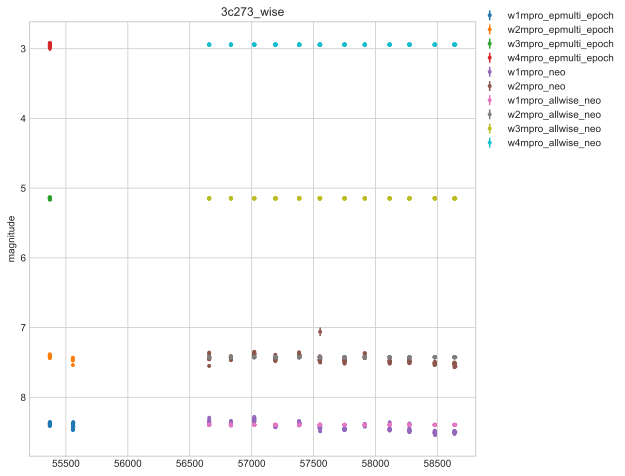

In [160]:
data_allwise_epoch=pd.read_csv('/Users/brettlv/Downloads/3C273/allwise_multi_epoch.csv')
data_neowise=pd.read_csv('/Users/brettlv/Downloads/3C273/neowise_3c273.csv')
fig, axs = plt.subplots(1, 1,figsize=(8,8))
axs.set_title('3c273_wise')

for i in range(4):
    name_mjd='mjd'
    name_band=data_allwise_epoch.columns[i*3+8]
    name_err=data_allwise_epoch.columns[i*3+9]
    print(name_mjd,name_band,name_err)
    data_band=data_allwise_epoch[data_allwise_epoch[name_mjd].notnull()]  
    axs.errorbar(data_band[name_mjd],data_band[name_band],data_band[name_err],fmt='.',label=name_band+'multi_epoch')
    mag_wise_data=pd.DataFrame({'t':data_band[name_mjd],'flux':data_band[name_band],'err':data_band[name_err]},index=None,columns=['t','flux','err'])
    mag_wise_data.to_csv('/Users/brettlv/Downloads/3C273/mag_wise_multi_%s_data.csv'%name_band,index=False,header=False)

    dcf_wise_data=pd.DataFrame({'t':data_band[name_mjd],'flux':(-48.6-data_band[name_band])/2.5,'err':data_band[name_err]/2.5},index=None,columns=['t','flux','err'])
    dcf_wise_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_wise_multi_%s_data.csv'%name_band,index=False,header=False)


data_neowise_select=data_neowise.loc[:, ['w1mpro', 'w1sigmpro',
         'w2mpro', 'w2sigmpro','w1mpro_allwise', 'w1sigmpro_allwise', 'w2mpro_allwise',
        'w2sigmpro_allwise', 'w3mpro_allwise', 'w3sigmpro_allwise',
        'w4mpro_allwise', 'w4sigmpro_allwise']]

for i in range(6):
    name_mjd='mjd'
    name_band=data_neowise_select.columns[i*2]
    name_err=data_neowise_select.columns[i*2+1]
    print(name_mjd,name_band,name_err)
    axs.errorbar(data_neowise[name_mjd],data_neowise_select[name_band],data_neowise_select[name_err],fmt='.',label=name_band+'_neo')
    axs.set_ylabel('magnitude')  
    mag_neowise_data=pd.DataFrame({'t':data_neowise[name_mjd],'flux':data_neowise[name_band],'err':data_neowise[name_err]},index=None,columns=['t','flux','err'])
    mag_neowise_data.to_csv('/Users/brettlv/Downloads/3C273/mag_neowise_%s_data.csv'%name_band,index=False,header=False)
    
    dcf_neowise_data=pd.DataFrame({'t':data_neowise[name_mjd],'flux':(-48.5-data_neowise[name_band])/2.5,'err':data_neowise[name_err]/2.5},index=None,columns=['t','flux','err'])
    dcf_neowise_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_neowise_%s_data.csv'%name_band,index=False,header=False)

axs.legend(loc=[1.0,0.7])
axs.invert_yaxis()
axs.set_ylabel('magnitude')
plt.savefig('/Users/brettlv/Downloads/wise_lc.png',dpi=400)

## Zhang2019

/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:1: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  if __name__ == '__main__':


mjd f_5100 ferr_5100
mjd Hbeta ferr_Hbeta
mjd Hgamma ferr_Hgamma
mjd Fe ferr_Fe
Int64Index([0, 1, 2, 3], dtype='int64')
Index(['jd_V', 'V', 'ferr_V', 'S'], dtype='object')


/Users/brettlv/anaconda3/lib/python3.6/site-packages/ipykernel/__main__.py:35: FutureWarning: Sorting because non-concatenation axis is not aligned. A future version
of pandas will change to not sort by default.

To accept the future behavior, pass 'sort=False'.

To retain the current behavior and silence the warning, pass 'sort=True'.



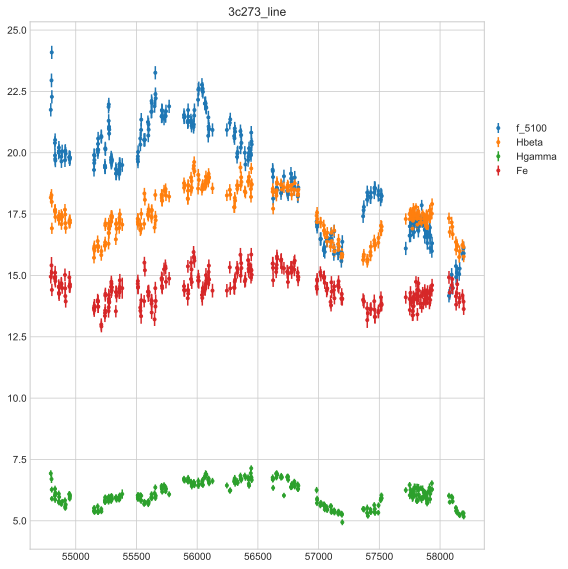

In [325]:
data_3c273_zhang=pd.read_csv('/Users/brettlv/Downloads/3C273/zhang_3c273.txt',delimiter='\s',skiprows=range(30),header=None)#
data_3c273_zhang.columns=['jd_spectra','f_5100','ferr_5100','Hbeta','ferr_Hbeta','Hgamma','ferr_Hgamma','Fe','ferr_Fe','Obs_spectra','jd_V','V','ferr_V','Obs_photometry']
data_3c273_zhang_line=data_3c273_zhang.loc[:, ['jd_spectra','f_5100','ferr_5100','Hbeta','ferr_Hbeta','Hgamma','ferr_Hgamma','Fe','ferr_Fe']]
data_3c273_zhang_line['mjd']=data_3c273_zhang_line['jd_spectra']-2400000.5



fig, axs = plt.subplots(1, 1,figsize=(8,8))
axs.set_title('3c273_line')

''' if name_band=='f_5100':        
        dcf_line_data=pd.DataFrame({'t':data_3c273_zhang_line[name_mjd],'flux':data_3c273_zhang_line[name_band]*1.0e-2,'err':data_3c273_zhang_line[name_err]*1.0e-2},index=None,columns=['t','flux','err'])        
    else:
'''
for i in range(4):
    name_mjd='mjd'
    name_band=data_3c273_zhang_line.columns[i*2+1]
    name_err=data_3c273_zhang_line.columns[i*2+2]
    print(name_mjd,name_band,name_err)
    
    dcf_line_data=pd.DataFrame({'t':data_3c273_zhang_line[name_mjd],'flux':data_3c273_zhang_line[name_band],'err':data_3c273_zhang_line[name_err]},index=None,columns=['t','flux','err'])        
    dcf_line_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_zhang_%s_data.csv'%name_band,index=False,header=False)
    plt.errorbar(dcf_line_data['t'],dcf_line_data['flux'],dcf_line_data['err'],fmt='.',label=name_band)
axs.legend(loc=[1.0,0.7])
fig.tight_layout()
plt.savefig('/Users/brettlv/Downloads/zhang_line_lc_origin.png',dpi=400)

data_3c273_zhang_V=data_3c273_zhang.loc[:, ['jd_V','V','ferr_V']]
data_3c273_zhang_V['mjd']=data_3c273_zhang['jd_V']-2400000.5
data_3c273_zhang_part2=pd.read_csv('/Users/brettlv/Downloads/3C273/zhang_3c273_part2.txt',delimiter='\s+',header=None)#
print(data_3c273_zhang_part2.columns)
data_3c273_zhang_part2.columns=['jd_V','V','ferr_V','S']
print(data_3c273_zhang_part2.columns)
data_3c273_zhang_part2['mjd']=data_3c273_zhang_part2['jd_V']-2400000.5
data_3c273_zhang_V_all=pd.concat([data_3c273_zhang_V,data_3c273_zhang_part2],ignore_index=True)


mag_data_3c273_zhang_V_all=pd.DataFrame({'t':data_3c273_zhang_V_all['mjd'],'flux':data_3c273_zhang_V_all['V'],'err':data_3c273_zhang_V_all['ferr_V']},index=None,columns=['t','flux','err'])
mag_data_3c273_zhang_V_all.to_csv('/Users/brettlv/Downloads/3C273/mag_data_3c273_zhang_V_all.csv',index=False,header=False)

dcf_data_3c273_zhang_V_all=pd.DataFrame({'t':data_3c273_zhang_V_all['mjd'],'flux':(-48.6-data_3c273_zhang_V_all['V'])/2.5,'err':data_3c273_zhang_V_all['ferr_V']/2.5},index=None,columns=['t','flux','err'])
dcf_data_3c273_zhang_V_all.to_csv('/Users/brettlv/Downloads/3C273/dcf_data_3c273_zhang_V_all.csv',index=False,header=False)


## MAXI

mjd 2-20 err2-20
mjd 2-4 err2-4
mjd 4-10 err4-10
mjd 10-20 err10-20


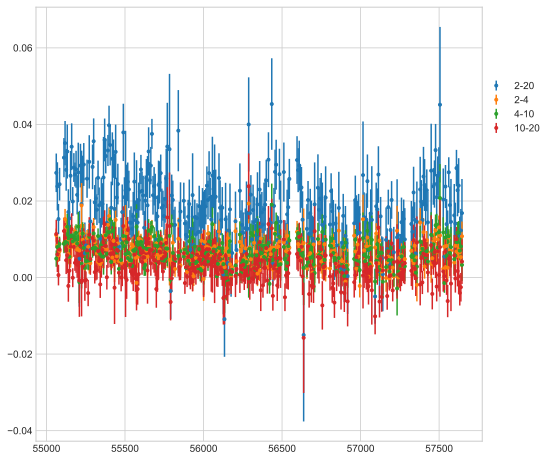

In [31]:
MAXI_week=pd.read_csv('/Users/brettlv/Downloads/3C273/J1229+020_weekbin_ge4days.txt',delimiter=',',header=None)
MAXI_week.columns=['mjd','2-20','err2-20','2-4','err2-4','4-10','err4-10','10-20','err10-20','n1','n2']
fig, axs = plt.subplots(1, 1,figsize=(8,8))
for i in range(4):
    name_mjd='mjd'
    name_band=MAXI_week.columns[i*2+1]
    name_err=MAXI_week.columns[i*2+2]
    print(name_mjd,name_band,name_err)
    dcf_maxi_data=pd.DataFrame({'t':MAXI_week[name_mjd],'flux':MAXI_week[name_band],'err':MAXI_week[name_err]},index=None,columns=['t','flux','err'])        
    dcf_maxi_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_maxi_%s_data.csv'%name_band,index=False,header=False)
    plt.errorbar(dcf_maxi_data['t'],dcf_maxi_data['flux'],dcf_maxi_data['err'],fmt='.',label=name_band)
axs.legend(loc=[1.0,0.7])
#plt.semilogy()
plt.savefig('/Users/brettlv/Downloads/MAXI_lc.png',dpi=400)


## BAT

In [32]:
bat_path='/Users/brettlv/Downloads/3C273/3C273.lc.fits'#BAT Scaled Map Transient 15-50
lightcurve_bat=pyfits.open(bat_path)
dcf_bat_data=pd.DataFrame({'t':lightcurve_bat[1].data['TIME'],'flux':lightcurve_bat[1].data['RATE'],'err':lightcurve_bat[1].data['ERROR']},index=None,columns=['t','flux','err'])
dcf_bat_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_X-bat_transient.csv',index=False,header=False)


#BAT suvert




In [341]:
bat_path_crabweighted='/Users/brettlv/Downloads/3C273/BAT_70m_crabweighted_SWIFT_J1229.1+0202.lc'#BAT Scaled Map Transient 15-50
lightcurve_bat_crabweighted=pyfits.open(bat_path_crabweighted)
#dcf_bat_data_crabweighted=pd.DataFrame({'t':lightcurve_bat[1].data['TIME'],'flux':lightcurve_bat[1].data['RATE'],'err':lightcurve_bat[1].data['ERROR']},index=None,columns=['t','flux','err'])
#dcf_bat_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_X-bat_transient.csv',index=False,header=False)

In [346]:
lightcurve_bat_crabweighted[1].columns

ColDefs(
    name = 'TIME'; format = '1D'; unit = 's'; disp = 'F13.1'
    name = 'EXPOSURE'; format = '1D'; unit = 's'; disp = 'F9.1'
    name = 'RATE'; format = '1D'; unit = 'Crab'; disp = 'F8.5'
    name = 'RATE_ERR'; format = '1D'; unit = 'Crab'; disp = 'F8.5'
    name = 'TIMEDEL'; format = '1D'; disp = 'F9.1'
    name = 'Year'; format = '1J'; disp = 'I4'
    name = 'Month'; format = '1J'; disp = 'I2'
    name = 'Mission_month'; format = '1J'; disp = 'I2'
)

## RXTE

In [33]:
data_3c273_xrt=pd.read_csv('/Users/brettlv/Downloads/3C273/lightcurve_xrt_3C273.txt',delimiter='\s+',skiprows=range(23),header=None)#
data_3c273_xrt.columns=['mjd','BinHW','flux','err','FracExp','mode']
dcf_xrt_data=pd.DataFrame({'t':data_3c273_xrt['mjd'],'flux':data_3c273_xrt['flux'],'err':data_3c273_xrt['err']},index=None,columns=['t','flux','err'])
dcf_xrt_data.to_csv('/Users/brettlv/Downloads/3C273/dcf_xrt_data.csv',index=False,header=False)

data_3c273_rxte=pd.read_csv('/Users/brettlv/Downloads/3C273/F0210_3C273.txt',delimiter='\s+',skiprows=range(6),header=None)#
data_3c273_rxte.columns=['mjd','flux','err','exposure']

dcf_data_3c273_rxte=pd.DataFrame({'t':data_3c273_rxte['mjd'],'flux':data_3c273_rxte['flux'],'err':data_3c273_rxte['err']},index=None,columns=['t','flux','err'])
dcf_data_3c273_rxte.to_csv('/Users/brettlv/Downloads/3C273/dcf_data_3c273_rxte.csv',index=False,header=False)

dcf_data_3c273_rxte_e10=pd.DataFrame({'t':data_3c273_rxte['mjd'],'flux':data_3c273_rxte['flux']*1e10,'err':data_3c273_rxte['err']*1e10},index=None,columns=['t','flux','err'])
dcf_data_3c273_rxte_e10.to_csv('/Users/brettlv/Downloads/3C273/dcf_e10_rxte.csv',index=False,header=False)


In [350]:
data_3c273_rxte_0204=pd.read_csv('/Users/brettlv/Downloads/3C273/F0204_3C273.txt',delimiter='\s+',skiprows=range(5),header=None)#
data_3c273_rxte_0204.columns=['mjd','flux','err','exposure']
dcf_data_3c273_rxte_0204=pd.DataFrame({'t':data_3c273_rxte_0204['mjd'],'flux':data_3c273_rxte_0204['flux'],'err':data_3c273_rxte_0204['err']},index=None,columns=['t','flux','err'])


In [352]:
data_3c273_rxte_0407=pd.read_csv('/Users/brettlv/Downloads/3C273/F0407_3C273.txt',delimiter='\s+',skiprows=range(5),header=None)#
data_3c273_rxte_0407.columns=['mjd','flux','err','exposure']
dcf_data_3c273_rxte_0407=pd.DataFrame({'t':data_3c273_rxte_0407['mjd'],'flux':data_3c273_rxte_0407['flux'],'err':data_3c273_rxte_0407['err']},index=None,columns=['t','flux','err'])

In [354]:
data_3c273_rxte_0710=pd.read_csv('/Users/brettlv/Downloads/3C273/F0710_3C273.txt',delimiter='\s+',skiprows=range(5),header=None)#
data_3c273_rxte_0710.columns=['mjd','flux','err','exposure']
dcf_data_3c273_rxte_0710=pd.DataFrame({'t':data_3c273_rxte_0710['mjd'],'flux':data_3c273_rxte_0710['flux'],'err':data_3c273_rxte_0710['err']},index=None,columns=['t','flux','err'])

In [359]:
data_3c273_rxte_gamma=pd.read_csv('/Users/brettlv/Downloads/3C273/Gamma_3C273_rxte.txt',delimiter='\s+',skiprows=range(7),header=None)#
data_3c273_rxte_gamma.columns=['mjd','gamma','gamma_l','gamma_r','exposure']
dcf_data_3c273_rxte_gamma=pd.DataFrame({'t':data_3c273_rxte_gamma['mjd'],'gamma':data_3c273_rxte_gamma['gamma'],'gamma_l':data_3c273_rxte_gamma['gamma_l'],'gamma_r':data_3c273_rxte_gamma['gamma_r']},index=None,columns=['t','gamma','gamma_l','gamma_r'])



In [365]:
fix,ax=plt.subplots(2, 1,figsize=(12,9))
  
ax[0].errorbar(dcf_data_3c273_rxte['t'], dcf_data_3c273_rxte['flux'],dcf_data_3c273_rxte['err'],fmt='.',label='0210keV')
ax[0].errorbar(dcf_data_3c273_rxte_0204['t'], dcf_data_3c273_rxte_0204['flux'],dcf_data_3c273_rxte_0204['err'],fmt='.',label='0204keV')

ax[0].errorbar(dcf_data_3c273_rxte_0407['t'], dcf_data_3c273_rxte_0407['flux'],dcf_data_3c273_rxte_0407['err'],fmt='.',label='0407keV')
ax[0].errorbar(dcf_data_3c273_rxte_0710['t'], dcf_data_3c273_rxte_0710['flux'],dcf_data_3c273_rxte_0710['err'],fmt='.',label='0710keV')



lower_error = dcf_data_3c273_rxte_gamma['gamma']-dcf_data_3c273_rxte_gamma['gamma_l']
upper_error = dcf_data_3c273_rxte_gamma['gamma_r']-dcf_data_3c273_rxte_gamma['gamma']
asymmetric_error = [lower_error, upper_error]
ax[1].errorbar(dcf_data_3c273_rxte_gamma['t'],dcf_data_3c273_rxte_gamma['gamma'],yerr=asymmetric_error,fmt='.')

ax[0].legend()
ax[0].set_xlabel('mjd')
ax[0].set_ylabel('flux($erg cm^{−2} s^{−1}$)')    
ax[1].set_ylabel('$\Gamma$')  
plt.tight_layout()    
plt.savefig('/Users/brettlv/Downloads/RXTE_lc_gamma_plot.png',dpi=400)    

In [360]:
dcf_data_3c273_rxte_gamma

,t,gamma,gamma_l,gamma_r
0,50115.060567,1.51479,1.47514,1.55329
1,50122.613160,1.53852,1.49501,1.55847
2,50133.116586,1.53872,1.47808,1.57995
3,50137.722419,1.56136,1.54222,1.58034
4,50143.863437,1.55032,1.51652,1.58358
5,50148.556956,1.53014,1.50885,1.55097
6,50155.139549,1.48138,1.45021,1.51179
7,50164.214178,1.68018,1.65695,1.70321
8,50187.430567,1.71271,1.68423,1.73754
9,50194.236586,1.65518,1.60996,1.67702


In [165]:
ls /Users/brettlv/Downloads/3C273/dcf*.csv > /Users/brettlv/Downloads/3C273/dcf_list.txt

In [168]:
ls /Users/brettlv/Downloads/3C273/mag*.csv > /Users/brettlv/Downloads/3C273/mag_list.txt

In [174]:
dcf_lists=[]
with open ('/Users/brettlv/Downloads/3C273/dcf_list.txt','r') as f:
    dcf_list=f.readlines()
    for line in dcf_list:
        dcf_lists.append(line.rstrip('\n'))        

In [171]:
mag_lists=[]
with open ('/Users/brettlv/Downloads/3C273/mag_list.txt','r') as f:
    mag_list=f.readlines()
    for line in dcf_list:
        mag_lists.append(line.rstrip('\n'))   

In [175]:
for i,path in enumerate(mag_lists):
    print(i,path.split('/')[-1])

0 mag_R_all.csv
1 mag_V_all.csv
2 mag_data_3c273_zhang_V_all.csv
3 mag_neowise_w1mpro_allwise_data.csv
4 mag_neowise_w1mpro_data.csv
5 mag_neowise_w2mpro_allwise_data.csv
6 mag_neowise_w2mpro_data.csv
7 mag_neowise_w3mpro_allwise_data.csv
8 mag_neowise_w4mpro_allwise_data.csv
9 mag_smarts_Bmag_data.csv
10 mag_smarts_Jmag_data.csv
11 mag_smarts_Kmag_data.csv
12 mag_smarts_Rmag_data.csv
13 mag_smarts_Vmag_data.csv
14 mag_wise_multi_w1mpro_ep_data.csv
15 mag_wise_multi_w2mpro_ep_data.csv
16 mag_wise_multi_w3mpro_ep_data.csv
17 mag_wise_multi_w4mpro_ep_data.csv


In [176]:
for i,path in enumerate(dcf_lists):
    print(i,path.split('/')[-1])

0 dcf_R_all.csv
1 dcf_VLBA_VLBA I_data.csv
2 dcf_VLBA_VLBA P_data.csv
3 dcf_VLBA_VLBA degree_data.csv
4 dcf_VLBA_VLBA percentage_data.csv
5 dcf_V_all.csv
6 dcf_alma_data.csv
7 dcf_bat_data.csv
8 dcf_butot_data.csv
9 dcf_data_3c273_rxte.csv
10 dcf_data_3c273_zhang_V_all.csv
11 dcf_e10_rxte.csv
12 dcf_e7_gamma3c273week.csv
13 dcf_gamma3c273week.csv
14 dcf_maxi_10-20_data.csv
15 dcf_maxi_2-20_data.csv
16 dcf_maxi_2-4_data.csv
17 dcf_maxi_4-10_data.csv
18 dcf_mojave_15GHz_data.csv
19 dcf_neowise_w1mpro_allwise_data.csv
20 dcf_neowise_w1mpro_data.csv
21 dcf_neowise_w2mpro_allwise_data.csv
22 dcf_neowise_w2mpro_data.csv
23 dcf_neowise_w3mpro_allwise_data.csv
24 dcf_neowise_w4mpro_allwise_data.csv
25 dcf_ovro_40m_data.csv
26 dcf_sma_1mm.csv
27 dcf_sma_850.csv
28 dcf_smarts_Bmag_data.csv
29 dcf_smarts_Jmag_data.csv
30 dcf_smarts_Kmag_data.csv
31 dcf_smarts_Rmag_data.csv
32 dcf_smarts_Vmag_data.csv
33 dcf_wise_multi_w1mpro_ep_data.csv
34 dcf_wise_multi_w2mpro_ep_data.csv
35 dcf_wise_multi_w3mpr

# mag

In [ ]:
0 mag_R_all.csv
1 mag_V_all.csv
2 mag_data_3c273_zhang_V_all.csv
3 mag_neowise_w1mpro_allwise_data.csv
4 mag_neowise_w1mpro_data.csv
5 mag_neowise_w2mpro_allwise_data.csv
6 mag_neowise_w2mpro_data.csv
7 mag_neowise_w3mpro_allwise_data.csv
8 mag_neowise_w4mpro_allwise_data.csv
9 mag_smarts_Bmag_data.csv
10 mag_smarts_Jmag_data.csv
11 mag_smarts_Kmag_data.csv
12 mag_smarts_Rmag_data.csv
13 mag_smarts_Vmag_data.csv
14 mag_wise_multi_w1mpro_ep_data.csv
15 mag_wise_multi_w2mpro_ep_data.csv
16 mag_wise_multi_w3mpro_ep_data.csv
17 mag_wise_multi_w4mpro_ep_data.csv

In [184]:
def plot_mag(m,mag_lists):
    mag_path=mag_lists[m]   
    mag_data=pd.read_csv(mag_path,header=None)
    plt.errorbar(mag_data[0], mag_data[1],mag_data[2],fmt='.',label=mag_path.split('/')[-1][4:-4])
    plt.legend(loc=(1.0,0.5))

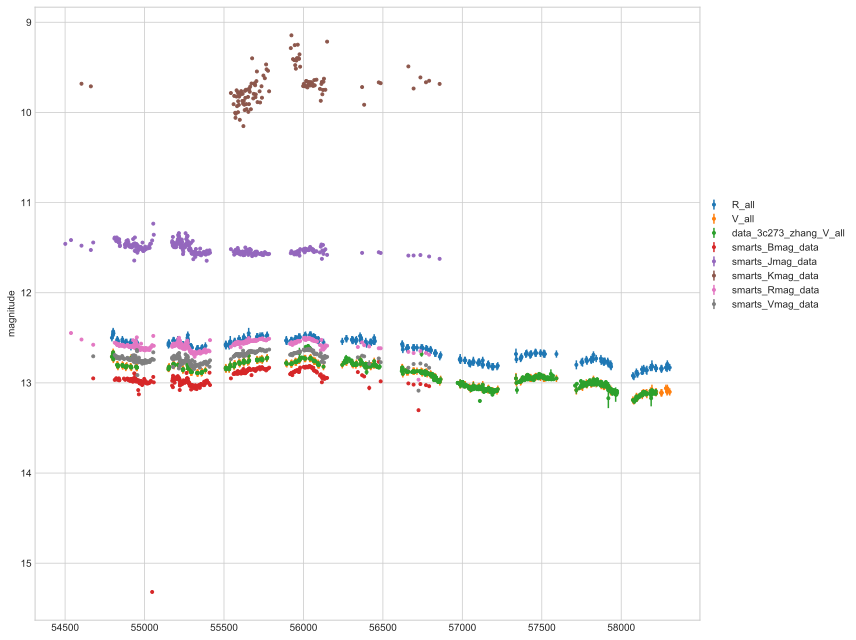

In [319]:
fix,ax=plt.subplots(1, 1,figsize=(12,9))
for i in range(3):
    plot_mag(i,mag_lists)
for i in range(9,14):
    plot_mag(i,mag_lists)    

ax.set_ylabel('magnitude')    
ax.invert_yaxis()    
plt.tight_layout()    
plt.savefig('/Users/brettlv/Downloads/optical_mag_lc.png',dpi=400)    

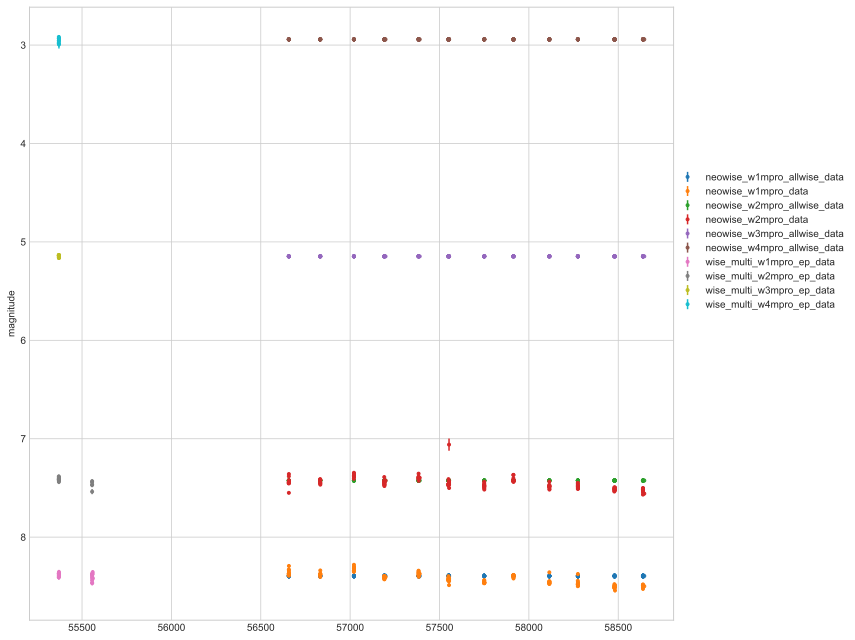

In [320]:
fix,ax=plt.subplots(1, 1,figsize=(12,9))
for i in range(3,9):
    plot_mag(i,mag_lists)
for i in range(14,18):
    plot_mag(i,mag_lists)    
ax.set_ylabel('magnitude')    
ax.invert_yaxis()           
plt.tight_layout()    
plt.savefig('/Users/brettlv/Downloads/wise_mag_lc.png',dpi=400)    

# dcf

In [ ]:
0 dcf_R_all.csv
1 dcf_VLBA_VLBA I_data.csv
2 dcf_VLBA_VLBA P_data.csv
3 dcf_VLBA_VLBA degree_data.csv
4 dcf_VLBA_VLBA percentage_data.csv
5 dcf_V_all.csv
6 dcf_alma_data.csv
7 dcf_bat_data.csv
8 dcf_butot_data.csv
9 dcf_data_3c273_rxte.csv
10 dcf_data_3c273_zhang_V_all.csv
11 dcf_e10_rxte.csv
12 dcf_e7_gamma3c273week.csv
13 dcf_gamma3c273week.csv
14 dcf_maxi_10-20_data.csv
15 dcf_maxi_2-20_data.csv
16 dcf_maxi_2-4_data.csv
17 dcf_maxi_4-10_data.csv
18 dcf_mojave_15GHz_data.csv
19 dcf_neowise_w1mpro_allwise_data.csv
20 dcf_neowise_w1mpro_data.csv
21 dcf_neowise_w2mpro_allwise_data.csv
22 dcf_neowise_w2mpro_data.csv
23 dcf_neowise_w3mpro_allwise_data.csv
24 dcf_neowise_w4mpro_allwise_data.csv
25 dcf_ovro_40m_data.csv
26 dcf_sma_1mm.csv
27 dcf_sma_850.csv
28 dcf_smarts_Bmag_data.csv
29 dcf_smarts_Jmag_data.csv
30 dcf_smarts_Kmag_data.csv
31 dcf_smarts_Rmag_data.csv
32 dcf_smarts_Vmag_data.csv
33 dcf_wise_multi_w1mpro_ep_data.csv
34 dcf_wise_multi_w2mpro_ep_data.csv
35 dcf_wise_multi_w3mpro_ep_data.csv
36 dcf_wise_multi_w4mpro_ep_data.csv
37 dcf_xrt_data.csv
38 dcf_zhang_Fe_data.csv
39 dcf_zhang_Hbeta_data.csv
40 dcf_zhang_Hgamma_data.csv
41 dcf_zhang_f_5100_data.csv

In [ ]:
import os
os.chdir('/Users/brettlv/timing_analysis/pydcf')

In [194]:
def plot_dcf(m,dcf_lists):
    dcf_path=dcf_lists[m]   
    dcf_data=pd.read_csv(dcf_path,header=None)
    plt.errorbar(dcf_data[0], dcf_data[1],dcf_data[2],fmt='.',label=dcf_path.split('/')[-1][4:-4])
    plt.legend(loc=(1.0,0.5))

In [ ]:
def plot_line_dcf(m,dcf_lists):
    dcf_path=dcf_lists[m]   
    dcf_data=pd.read_csv(dcf_path,header=None)
    plt.errorbar(dcf_data[0], dcf_data[1],dcf_data[2],fmt='.',label=dcf_path.split('/')[-1][4:-4])
    plt.legend(loc=(1.0,0.5))

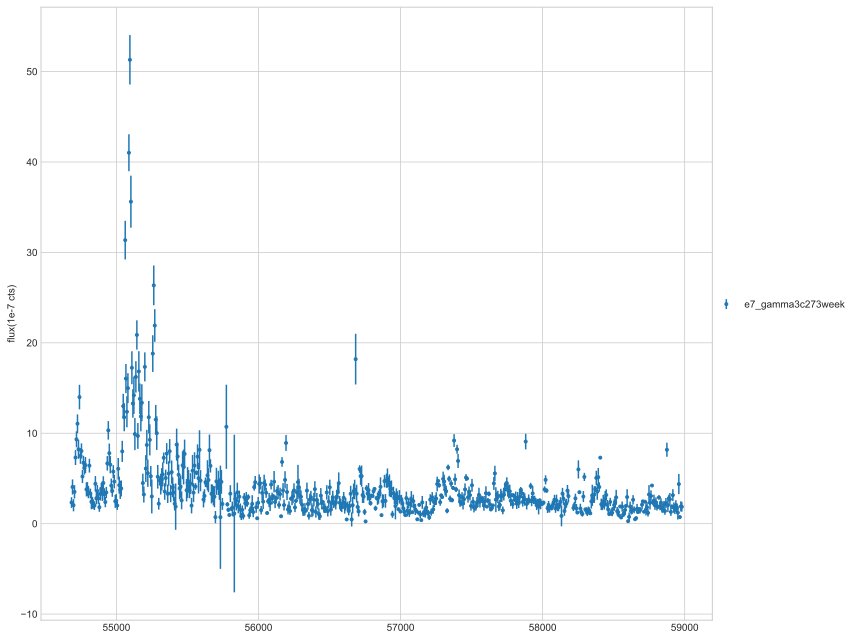

In [330]:
fix,ax=plt.subplots(1, 1,figsize=(12,9))
  
plot_dcf(12,dcf_lists)

ax.set_ylabel('flux(1e-7 cts)')    

plt.tight_layout()    
plt.savefig('/Users/brettlv/Downloads/gamma_lc_plot.png',dpi=400)    

In [ ]:
gamma_lc_plot.png

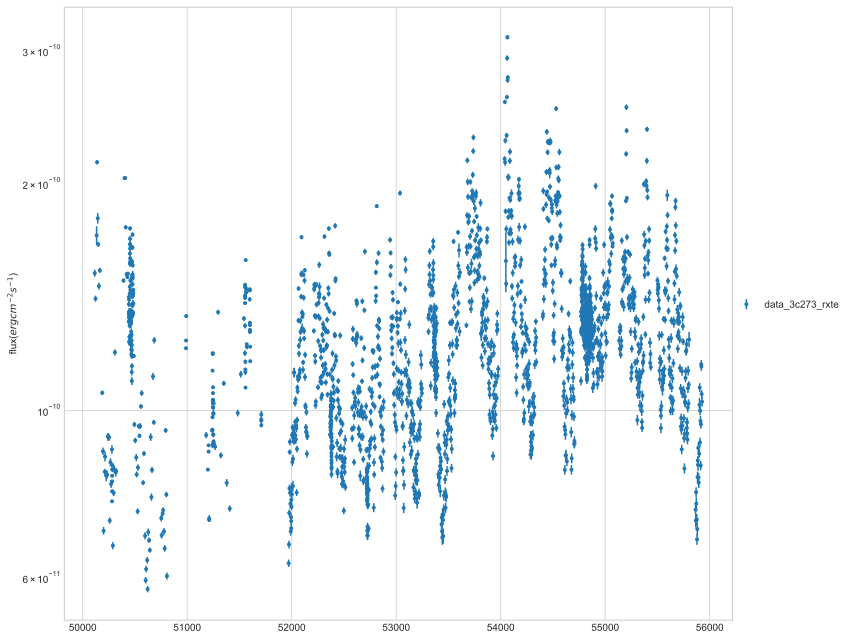

In [339]:
fix,ax=plt.subplots(1, 1,figsize=(12,9))
  
plot_dcf(9,dcf_lists)


ax.set_ylabel('flux($erg cm^{−2} s^{−1}$)')    
plt.semilogy()
plt.tight_layout()    
plt.savefig('/Users/brettlv/Downloads/RXTE_lc_plot.png',dpi=400)    

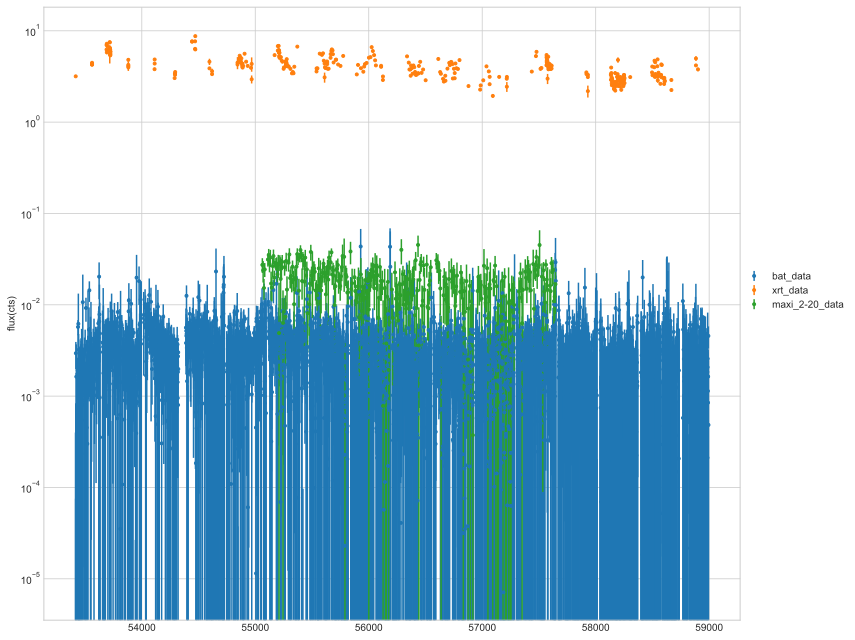

In [336]:
fix,ax=plt.subplots(1, 1,figsize=(12,9))
  
plot_dcf(7,dcf_lists)
plot_dcf(37,dcf_lists)
plot_dcf(15,dcf_lists)

'''for i in range(14,18):
    plot_dcf(i,dcf_lists) ''' 




ax.set_ylabel('flux(cts)')    
plt.semilogy()
plt.tight_layout()    
plt.savefig('/Users/brettlv/Downloads/X-ray_lc_plot.png',dpi=400)    

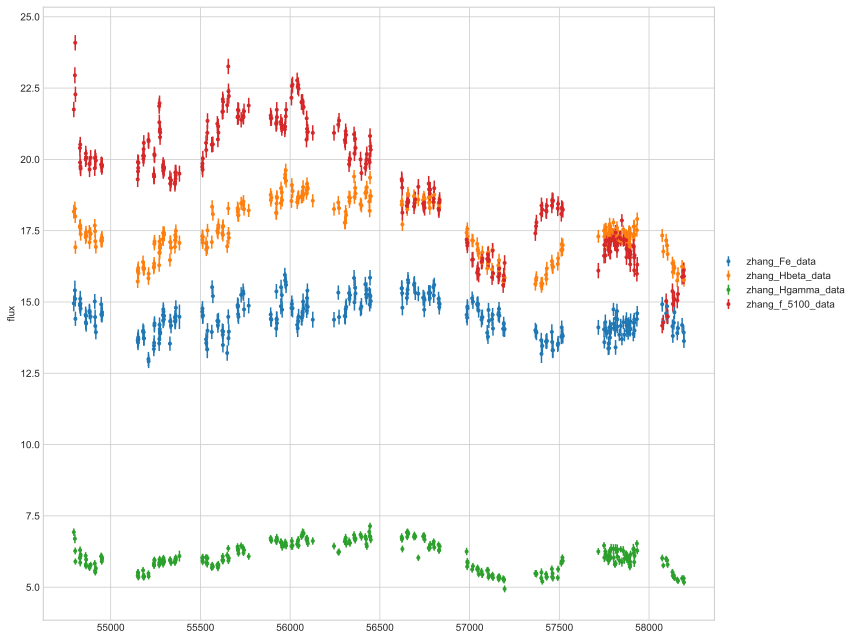

In [334]:
fix,ax=plt.subplots(1, 1,figsize=(12,9))
for i in range(38,42):
    plot_dcf(i,dcf_lists)    

ax.set_ylabel('flux') 

#ax.invert_yaxis()    
plt.tight_layout()    
plt.savefig('/Users/brettlv/Downloads/zhang_line_lc_plot.png',dpi=400)    

# distance

In [195]:
from astropy.cosmology import FlatLambdaCDM,Planck13,Planck15,z_at_value
from astropy import units as u
import astropy
from astropy.cosmology import LambdaCDM
cosmo = LambdaCDM(H0=70, Om0=0.3, Ode0=0.7)
#cosmo=FlatLambdaCDM(H0=73,Om0=0.3)
D_cm=cosmo.luminosity_distance(z=0.158339).to(u.cm)

In [196]:
D_cm

<Quantity 2.33503468e+27 cm>

# plot_all

In [380]:
from matplotlib.ticker import (
                               AutoLocator, AutoMinorLocator)
import matplotlib.ticker as ticker

def plot_axi_dcf(m,dcf_lists,axi):
    dcf_path=dcf_lists[m]   
    dcf_data=pd.read_csv(dcf_path,header=None)
    name_band=dcf_path.split('/')[-1][4:-4]
    axs[axi].errorbar(dcf_data[0], dcf_data[1],dcf_data[2],fmt='.',label=name_band)
    axs[axi].legend(loc=(1.0,0.5))

def plot_all(dcf_lists,axi=0):   
    plot_axi_dcf(12,dcf_lists,axi)#fermi-gamma
    
    plot_axi_dcf(15,dcf_lists,1)#X-ray maxi
    plot_axi_dcf(7,dcf_lists,1)#bat
    plot_axi_dcf(37,dcf_lists,1)#xrt
    plot_axi_dcf(11,dcf_lists,2)#rxte
    
    
    plot_axi_dcf(6,dcf_lists,3)
    plot_axi_dcf(8,dcf_lists,3)
    plot_axi_dcf(18,dcf_lists,3)
    plot_axi_dcf(25,dcf_lists,3)
    plot_axi_dcf(26,dcf_lists,3)
    plot_axi_dcf(27,dcf_lists,3)#radio
    
    
    plot_axi_dcf(38,dcf_lists,4)
    plot_axi_dcf(39,dcf_lists,4)
    plot_axi_dcf(40,dcf_lists,4)
    plot_axi_dcf(41,dcf_lists,4)#line_emission
    
    
    plot_axi_dcf(0,dcf_lists,5)
    plot_axi_dcf(5,dcf_lists,5)
    plot_axi_dcf(28,dcf_lists,5)
    plot_axi_dcf(29,dcf_lists,5)
    plot_axi_dcf(30,dcf_lists,5)
    plot_axi_dcf(31,dcf_lists,5)
    plot_axi_dcf(32,dcf_lists,5)
    plot_axi_dcf(10,dcf_lists,5)#optical
    
    plot_axi_dcf(19,dcf_lists,6)#wise
    plot_axi_dcf(20,dcf_lists,6)
    plot_axi_dcf(21,dcf_lists,6)
    plot_axi_dcf(22,dcf_lists,6)
    plot_axi_dcf(23,dcf_lists,6)
    plot_axi_dcf(24,dcf_lists,6)
    plot_axi_dcf(33,dcf_lists,6)
    plot_axi_dcf(34,dcf_lists,6)
    plot_axi_dcf(35,dcf_lists,6)
    plot_axi_dcf(36,dcf_lists,6)


In [382]:
fig, axs = plt.subplots(7, 1,sharex=False,figsize=(8,56)) 
plot_all(dcf_lists)
axs[1].semilogy()
fig.tight_layout()
plt.subplots_adjust(hspace = 0.05)
plt.savefig('/Users/brettlv/Downloads/3C273_multi_band_lc_flux.pdf',dpi=400)

# time_lag

In [203]:
import os 
def get_data(path):    
    data=pd.read_csv(path,header=None)
    return data

def get_min_max(data):
    return min(data[0]),max(data[1])

def get_lc_data(data):    
    t1,dy1,y_obs1= (data[0],data[2],data[1]) 
    return t1,dy1,y_obs1

def get_new_range_data(t,dy,y_obs,rangemin,rangemax):    
    t1new,dy1new,y_obs1new=t[t>=rangemin],dy[t>=rangemin],y_obs[t>=rangemin]
    t2new,dy2new,y_obs2new=t1new[t<=rangemax],dy1new[t<=rangemax],y_obs1new[t<=rangemax]   
    return t2new,dy2new,y_obs2new

def get_mean_interval(t):
    return int(np.max(t)-np.min(t))/(len(t)-1)

def get_interval(t):
    return int(np.max(t)-np.min(t))


def get_name(m,n,dcf_lists):
    path1=dcf_lists[m]
    path2=dcf_lists[n]    
    newpath1=path1.split('/')[-1][4:-4]
    newpath2=path2.split('/')[-1][4:-4]
    newfile1='/Users/brettlv/timing_analysis/pydcf/3c273/dcf_new_%s_%s.csv'%(newpath1,newpath2)
    newfile2='/Users/brettlv/timing_analysis/pydcf/3c273/dcf_new_%s_%s.csv'%(newpath2,newpath1)  
    return newpath1,newpath2,newfile1,newfile2

def get_new_range_datas(m,n,dcf_lists,rangemin,rangemax):
    path1=dcf_lists[m]
    path2=dcf_lists[n] 
    data1=get_data(path1)
    t1,dy1,y_obs1=get_lc_data(data1)
    t1new,dy1new,y_obs1new=get_new_range_data(t1,dy1,y_obs1,rangemin,rangemax)
    data2=get_data(path2)
    t2,dy2,y_obs2=get_lc_data(data2)   
    t2new,dy2new,y_obs2new=get_new_range_data(t2,dy2,y_obs2,rangemin,rangemax) 
    return t1new,dy1new,y_obs1new,t2new,dy2new,y_obs2new

def write_dcf_data(m,n,dcf_lists,rangemin,rangemax):     
    newpath1,newpath2,newfile1,newfile2=get_name(m,n,dcf_lists)
    t1new,dy1new,y_obs1new,t2new,dy2new,y_obs2new=get_new_range_datas(m,n,dcf_lists,rangemin,rangemax)
    dcf_data_write1=pd.DataFrame({'t':t1new,'flux':y_obs1new,'err':dy1new},index=None,columns=['t','flux','err'])
    dcf_data_write1.to_csv(newfile1,index=False,header=False)
    dcf_data_write2=pd.DataFrame({'t':t2new,'flux':y_obs2new,'err':dy2new},index=None,columns=['t','flux','err'])
    dcf_data_write2.to_csv(newfile2,index=False,header=False)
    


## get_time_lag_two_series

In [278]:
def get_time_lag_two_series_gauss(m,n,dcf_lists,rangemin=0,rangemax=60000,p=2):     
    newpath1,newpath2,newfile1,newfile2=get_name(m,n,dcf_lists)
    t1new,dy1new,y_obs1new,t2new,dy2new,y_obs2new=get_new_range_datas(m,n,dcf_lists,rangemin,rangemax)
    print(newpath1,newpath2,newfile1,newfile2)
    dt_width=min(get_mean_interval(t1new),get_mean_interval(t2new))*10
    lh_length=min(get_interval(t1new),get_interval(t2new))*0.5
    print(get_mean_interval(t1new),get_mean_interval(t2new))
    write_dcf_data(m,n,dcf_lists,rangemin,rangemax)
    command='python3 dcf_test.py %s %s %d %d %d %d %d -w=gauss -p=%d -o '%(newfile1,newfile2,-lh_length,lh_length,dt_width,rangemin,rangemax,p)
    print(command)  
    os.system(command)
def get_time_lag_two_series_slot(m,n,dcf_lists,rangemin=0,rangemax=60000,p=2):     
    newpath1,newpath2,newfile1,newfile2=get_name(m,n,dcf_lists)
    t1new,dy1new,y_obs1new,t2new,dy2new,y_obs2new=get_new_range_datas(m,n,dcf_lists,rangemin,rangemax)
    print(newpath1,newpath2,newfile1,newfile2)
    dt_width=min(get_mean_interval(t1new),get_mean_interval(t2new))*10
    lh_length=min(get_interval(t1new),get_interval(t2new))*0.5
    print(get_mean_interval(t1new),get_mean_interval(t2new))
    write_dcf_data(m,n,dcf_lists,rangemin,rangemax)
    command='python3 dcf_test.py %s %s %d %d %d %d %d -w=slot -p=%d -o '%(newfile1,newfile2,-lh_length,lh_length,dt_width,rangemin,rangemax,p)
    print(command)  
    os.system(command)        

In [232]:
get_time_lag_two_series_gauss(26,27,dcf_lists,p=2)

sma_1mm sma_850 /Users/brettlv/timing_analysis/pydcf/test/dcf_new_sma_1mm_sma_850.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_sma_850_sma_1mm.csv
9.326594090202176 45.78861788617886
python dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_sma_1mm_sma_850.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_sma_850_sma_1mm.csv -2816 2816 93 0 60000 -w=gauss -p=2 -o 


In [234]:
get_time_lag_two_series_gauss(25,26,dcf_lists,p=2)

ovro_40m_data sma_1mm /Users/brettlv/timing_analysis/pydcf/test/dcf_new_ovro_40m_data_sma_1mm.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_sma_1mm_ovro_40m_data.csv
5.797101449275362 9.326594090202176
python dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_ovro_40m_data_sma_1mm.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_sma_1mm_ovro_40m_data.csv -2200 2200 57 0 60000 -w=gauss -p=2 -o 


## get_time_lag_two_series specific

In [279]:
def get_time_lag_two_series_gauss_specific(m,n,dcf_lists,rangemin,rangemax,l_length,h_length,dt_width,p=2):     
    newpath1,newpath2,newfile1,newfile2=get_name(m,n,dcf_lists)
    t1new,dy1new,y_obs1new,t2new,dy2new,y_obs2new=get_new_range_datas(m,n,dcf_lists,rangemin,rangemax)
    print('mean interval: ',newpath1,get_mean_interval(t1new))        
    print('mean interval: ',newpath2,get_mean_interval(t2new))
    print('timerange:',rangemin,'-',rangemax)
    print('lag_range:',l_length,'-',h_length)
    print('dT:',dt_width)
    
    
    #(newfile1,newfile2)
    #dt_width=min(get_mean_interval(t1new),get_mean_interval(t2new))*10
    #lh_length=min(get_interval(t1new),get_interval(t2new))*0.5
    #print(get_mean_interval(t1new),get_mean_interval(t2new))
    write_dcf_data(m,n,dcf_lists,rangemin,rangemax)
    command='python3 dcf_test.py %s %s %d %d %d %d %d -w=gauss -p=%d -o '%(newfile1,newfile2,l_length,h_length,dt_width,rangemin,rangemax,p)
    print(command)
    os.system(command)
    
def get_time_lag_two_series_slot_specific(m,n,dcf_lists,rangemin,rangemax,l_length,h_length,dt_width,p=2):     
    newpath1,newpath2,newfile1,newfile2=get_name(m,n,dcf_lists)
    t1new,dy1new,y_obs1new,t2new,dy2new,y_obs2new=get_new_range_datas(m,n,dcf_lists,rangemin,rangemax)
    print('mean interval: ',newpath1,get_mean_interval(t1new))        
    print('mean interval: ',newpath2,get_mean_interval(t2new))
    print('timerange:',rangemin,'-',rangemax)
    print('lag_range:',l_length,'-',h_length)
    print('dT:',dt_width)
    
    
    #(newfile1,newfile2)
    #dt_width=min(get_mean_interval(t1new),get_mean_interval(t2new))*10
    #lh_length=min(get_interval(t1new),get_interval(t2new))*0.5
    #print(get_mean_interval(t1new),get_mean_interval(t2new))
    write_dcf_data(m,n,dcf_lists,rangemin,rangemax)
    command='python3 dcf_test.py %s %s %d %d %d %d %d -w=slot -p=%d -o '%(newfile1,newfile2,l_length,h_length,dt_width,rangemin,rangemax,p)
    print(command)
    os.system(command)    
    
    

## finish

In [305]:
def finish_default(m,n,dcf_lists):
    for i in range(3):
        get_time_lag_two_series_gauss(m,n,dcf_lists,p=i)
        get_time_lag_two_series_slot(m,n,dcf_lists,p=i)

def finish_specific(m,n,dcf_lists,rangemin,rangemax,l_length,h_length,dt_width):
    for i in range(3):
        get_time_lag_two_series_gauss_specific(m,n,dcf_lists,rangemin,rangemax,l_length,h_length,dt_width,p=i)     
        get_time_lag_two_series_slot_specific(m,n,dcf_lists,rangemin,rangemax,l_length,h_length,dt_width,p=i)     
   
        
        

In [236]:
get_time_lag_two_series_gauss_specific(25,26,dcf_lists,rangemin=54400,rangemax=59000,l_length=-1000,h_length=1000,dt_width=50)

mean interval:  ovro_40m_data 5.797101449275362
mean interval:  sma_1mm 8.171814671814673
timerange: 54400 - 59000
lag_range: -1000 - 1000
dT: 50
python dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_ovro_40m_data_sma_1mm.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_sma_1mm_ovro_40m_data.csv -1000 1000 50 54400 59000 -w=gauss -p=2 -o 


In [246]:
get_time_lag_two_series_gauss_specific(12,11,dcf_lists,rangemin=54700,rangemax=56000,l_length=-500,h_length=500,dt_width=30)

mean interval:  e7_gamma3c273week 7.223463687150838
mean interval:  e10_rxte 2.0214521452145213
timerange: 54700 - 56000
lag_range: -500 - 500
dT: 30
python dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_e10_rxte.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e10_rxte_e7_gamma3c273week.csv -500 500 30 54700 56000 -w=gauss -p=2 -o 


### fermi

In [366]:
finish_default(12,11,dcf_lists)

e7_gamma3c273week e10_rxte /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_e10_rxte.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e10_rxte_e7_gamma3c273week.csv
7.124378109452737 2.9663093415007658
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_e10_rxte.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e10_rxte_e7_gamma3c273week.csv -2148 2148 29 0 60000 -w=gauss -p=0 -o 
e7_gamma3c273week e10_rxte /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_e10_rxte.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e10_rxte_e7_gamma3c273week.csv
7.124378109452737 2.9663093415007658
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_e10_rxte.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e10_rxte_e7_gamma3c273week.csv -2148 2148 29 0 60000 -w=slot -p=0 -o 
e7_gamma3c273week e10_rxte /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_e10_rxte.c

In [367]:
finish_specific(12,11,dcf_lists,rangemin=54200,rangemax=56200,l_length=-1000,h_length=1000,dt_width=25)



mean interval:  e7_gamma3c273week 7.190476190476191
mean interval:  e10_rxte 2.1670854271356785
timerange: 54200 - 56200
lag_range: -1000 - 1000
dT: 25
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_e10_rxte.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e10_rxte_e7_gamma3c273week.csv -1000 1000 25 54200 56200 -w=gauss -p=0 -o 
mean interval:  e7_gamma3c273week 7.190476190476191
mean interval:  e10_rxte 2.1670854271356785
timerange: 54200 - 56200
lag_range: -1000 - 1000
dT: 25
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_e10_rxte.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e10_rxte_e7_gamma3c273week.csv -1000 1000 25 54200 56200 -w=slot -p=0 -o 
mean interval:  e7_gamma3c273week 7.190476190476191
mean interval:  e10_rxte 2.1670854271356785
timerange: 54200 - 56200
lag_range: -1000 - 1000
dT: 25
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_e10_r

In [368]:
finish_specific(12,11,dcf_lists,rangemin=54200,rangemax=56200,l_length=-2000,h_length=2000,dt_width=70)


mean interval:  e7_gamma3c273week 7.190476190476191
mean interval:  e10_rxte 2.1670854271356785
timerange: 54200 - 56200
lag_range: -2000 - 2000
dT: 70
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_e10_rxte.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e10_rxte_e7_gamma3c273week.csv -2000 2000 70 54200 56200 -w=gauss -p=0 -o 
mean interval:  e7_gamma3c273week 7.190476190476191
mean interval:  e10_rxte 2.1670854271356785
timerange: 54200 - 56200
lag_range: -2000 - 2000
dT: 70
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_e10_rxte.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e10_rxte_e7_gamma3c273week.csv -2000 2000 70 54200 56200 -w=slot -p=0 -o 
mean interval:  e7_gamma3c273week 7.190476190476191
mean interval:  e10_rxte 2.1670854271356785
timerange: 54200 - 56200
lag_range: -2000 - 2000
dT: 70
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_e10_r

In [369]:
finish_default(12,26,dcf_lists)

e7_gamma3c273week sma_1mm /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_sma_1mm.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_sma_1mm_e7_gamma3c273week.csv
7.124378109452737 9.326594090202176
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_sma_1mm.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_sma_1mm_e7_gamma3c273week.csv -2148 2148 71 0 60000 -w=gauss -p=0 -o 
e7_gamma3c273week sma_1mm /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_sma_1mm.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_sma_1mm_e7_gamma3c273week.csv
7.124378109452737 9.326594090202176
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_sma_1mm.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_sma_1mm_e7_gamma3c273week.csv -2148 2148 71 0 60000 -w=slot -p=0 -o 
e7_gamma3c273week sma_1mm /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_sma_1mm.csv /Users/bret

In [370]:
finish_specific(12,26,dcf_lists,rangemin=54600,rangemax=58800,l_length=-2000,h_length=2000,dt_width=70)



mean interval:  e7_gamma3c273week 7.12998266897747
mean interval:  sma_1mm 8.280163599182004
timerange: 54600 - 58800
lag_range: -2000 - 2000
dT: 70
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_sma_1mm.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_sma_1mm_e7_gamma3c273week.csv -2000 2000 70 54600 58800 -w=gauss -p=0 -o 
mean interval:  e7_gamma3c273week 7.12998266897747
mean interval:  sma_1mm 8.280163599182004
timerange: 54600 - 58800
lag_range: -2000 - 2000
dT: 70
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_sma_1mm.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_sma_1mm_e7_gamma3c273week.csv -2000 2000 70 54600 58800 -w=slot -p=0 -o 
mean interval:  e7_gamma3c273week 7.12998266897747
mean interval:  sma_1mm 8.280163599182004
timerange: 54600 - 58800
lag_range: -2000 - 2000
dT: 70
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_e7_gamma3c273week_sma_1mm.csv /Users

## Line

In [306]:
finish_default(41,38,dcf_lists)

zhang_f_5100_data zhang_Fe_data /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Fe_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Fe_data_zhang_f_5100_data.csv
11.522033898305084 11.522033898305084
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Fe_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Fe_data_zhang_f_5100_data.csv -1699 1699 115 0 60000 -w=gauss -p=0 -o 
zhang_f_5100_data zhang_Fe_data /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Fe_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Fe_data_zhang_f_5100_data.csv
11.522033898305084 11.522033898305084
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Fe_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Fe_data_zhang_f_5100_data.csv -1699 1699 115 0 60000 -w=slot -p=0 -o 
zhang_f_5100_data zhang_Fe_data /Users/brettlv/timi

In [307]:
finish_specific(41,38,dcf_lists,rangemin=54000,rangemax=59000,l_length=-1000,h_length=1000,dt_width=110)

mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Fe_data 11.522033898305084
timerange: 54000 - 59000
lag_range: -1000 - 1000
dT: 110
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Fe_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Fe_data_zhang_f_5100_data.csv -1000 1000 110 54000 59000 -w=gauss -p=0 -o 
mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Fe_data 11.522033898305084
timerange: 54000 - 59000
lag_range: -1000 - 1000
dT: 110
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Fe_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Fe_data_zhang_f_5100_data.csv -1000 1000 110 54000 59000 -w=slot -p=0 -o 
mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Fe_data 11.522033898305084
timerange: 54000 - 59000
lag_range: -1000 - 1000
dT: 110
python3 dcf_test.py /Users/brettlv/timing_analysis

In [308]:
finish_default(41,39,dcf_lists)

zhang_f_5100_data zhang_Hbeta_data /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Hbeta_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Hbeta_data_zhang_f_5100_data.csv
11.522033898305084 11.522033898305084
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Hbeta_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Hbeta_data_zhang_f_5100_data.csv -1699 1699 115 0 60000 -w=gauss -p=0 -o 
zhang_f_5100_data zhang_Hbeta_data /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Hbeta_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Hbeta_data_zhang_f_5100_data.csv
11.522033898305084 11.522033898305084
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Hbeta_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Hbeta_data_zhang_f_5100_data.csv -1699 1699 115 0 60000 -w=slot -p=0 -o 
zhang_f_5100_data zha

In [309]:
finish_specific(41,39,dcf_lists,rangemin=54000,rangemax=59000,l_length=-1000,h_length=1000,dt_width=110)

mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Hbeta_data 11.522033898305084
timerange: 54000 - 59000
lag_range: -1000 - 1000
dT: 110
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Hbeta_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Hbeta_data_zhang_f_5100_data.csv -1000 1000 110 54000 59000 -w=gauss -p=0 -o 
mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Hbeta_data 11.522033898305084
timerange: 54000 - 59000
lag_range: -1000 - 1000
dT: 110
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Hbeta_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Hbeta_data_zhang_f_5100_data.csv -1000 1000 110 54000 59000 -w=slot -p=0 -o 
mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Hbeta_data 11.522033898305084
timerange: 54000 - 59000
lag_range: -1000 - 1000
dT: 110
python3 dcf_test.py /Users/br

In [310]:
finish_default(41,40,dcf_lists)

zhang_f_5100_data zhang_Hgamma_data /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Hgamma_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Hgamma_data_zhang_f_5100_data.csv
11.522033898305084 11.522033898305084
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Hgamma_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Hgamma_data_zhang_f_5100_data.csv -1699 1699 115 0 60000 -w=gauss -p=0 -o 
zhang_f_5100_data zhang_Hgamma_data /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Hgamma_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Hgamma_data_zhang_f_5100_data.csv
11.522033898305084 11.522033898305084
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Hgamma_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Hgamma_data_zhang_f_5100_data.csv -1699 1699 115 0 60000 -w=slot -p=0 -o 
zhang_f_510

In [311]:
finish_specific(41,40,dcf_lists,rangemin=54000,rangemax=59000,l_length=-1000,h_length=1000,dt_width=110)

mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Hgamma_data 11.522033898305084
timerange: 54000 - 59000
lag_range: -1000 - 1000
dT: 110
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Hgamma_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Hgamma_data_zhang_f_5100_data.csv -1000 1000 110 54000 59000 -w=gauss -p=0 -o 
mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Hgamma_data 11.522033898305084
timerange: 54000 - 59000
lag_range: -1000 - 1000
dT: 110
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Hgamma_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Hgamma_data_zhang_f_5100_data.csv -1000 1000 110 54000 59000 -w=slot -p=0 -o 
mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Hgamma_data 11.522033898305084
timerange: 54000 - 59000
lag_range: -1000 - 1000
dT: 110
python3 dcf_test.py /U

In [312]:
finish_specific(41,38,dcf_lists,rangemin=54000,rangemax=59000,l_length=0,h_length=500,dt_width=50)

mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Fe_data 11.522033898305084
timerange: 54000 - 59000
lag_range: 0 - 500
dT: 50
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Fe_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Fe_data_zhang_f_5100_data.csv 0 500 50 54000 59000 -w=gauss -p=0 -o 
mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Fe_data 11.522033898305084
timerange: 54000 - 59000
lag_range: 0 - 500
dT: 50
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Fe_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Fe_data_zhang_f_5100_data.csv 0 500 50 54000 59000 -w=slot -p=0 -o 
mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Fe_data 11.522033898305084
timerange: 54000 - 59000
lag_range: 0 - 500
dT: 50
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_51

In [313]:
finish_specific(41,39,dcf_lists,rangemin=54000,rangemax=59000,l_length=-100,h_length=400,dt_width=50)

mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Hbeta_data 11.522033898305084
timerange: 54000 - 59000
lag_range: -100 - 400
dT: 50
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Hbeta_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Hbeta_data_zhang_f_5100_data.csv -100 400 50 54000 59000 -w=gauss -p=0 -o 
mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Hbeta_data 11.522033898305084
timerange: 54000 - 59000
lag_range: -100 - 400
dT: 50
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Hbeta_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Hbeta_data_zhang_f_5100_data.csv -100 400 50 54000 59000 -w=slot -p=0 -o 
mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Hbeta_data 11.522033898305084
timerange: 54000 - 59000
lag_range: -100 - 400
dT: 50
python3 dcf_test.py /Users/brettlv/timing_an

In [314]:
finish_specific(41,40,dcf_lists,rangemin=54000,rangemax=59000,l_length=-100,h_length=400,dt_width=50)

mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Hgamma_data 11.522033898305084
timerange: 54000 - 59000
lag_range: -100 - 400
dT: 50
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Hgamma_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Hgamma_data_zhang_f_5100_data.csv -100 400 50 54000 59000 -w=gauss -p=0 -o 
mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Hgamma_data 11.522033898305084
timerange: 54000 - 59000
lag_range: -100 - 400
dT: 50
python3 dcf_test.py /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_f_5100_data_zhang_Hgamma_data.csv /Users/brettlv/timing_analysis/pydcf/test/dcf_new_zhang_Hgamma_data_zhang_f_5100_data.csv -100 400 50 54000 59000 -w=slot -p=0 -o 
mean interval:  zhang_f_5100_data 11.522033898305084
mean interval:  zhang_Hgamma_data 11.522033898305084
timerange: 54000 - 59000
lag_range: -100 - 400
dT: 50
python3 dcf_test.py /Users/brettlv/ti

# get_simul_time_data_spectrum

In [ ]:
def get_simul_time_data_spectrum(m,dcf_lists,time):
    dcf_path=dcf_lists[m]   
    dcf_data=pd.read_csv(dcf_path,header=None)
    dcf_data_time=dcf_data[abs(dcf_data[0]-time)<1]
    
    